## Transforming Photos into Monet-Style Artwork

In this notebook, we will train a model on a dataset of Monet's art, and then apply it to a set of images in order to produce a selection of images that appear as if they were painted by Monet.

### Model 1 : CycleGAN

In [46]:
# imports
import tensorflow as tf
from tensorflow import keras
from keras import *
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import numpy as np
import random

# to clean up the notebook
# and to make these warnings issues for future us
import warnings 
warnings.filterwarnings('ignore')

First we must load in our dataset.

In [38]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
IMAGE_SIZE = [256, 256]

# functions to read in the data
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels = 3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {"image_name": tf.io.FixedLenFeature([], tf.string),
                       "image": tf.io.FixedLenFeature([], tf.string),
                       "target": tf.io.FixedLenFeature([], tf.string)}
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

# extract images from the files
def load_dataset(filenames, labeled = True, ordered = False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

In [39]:
# get file names of the data
MONET_FILENAMES = tf.io.gfile.glob("data/monet_tfrec" + "/*.tfrec")
PHOTO_FILENAMES = tf.io.gfile.glob("data/photo_tfrec" + "/*.tfrec")

# load in the datasets
monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(1)

# get example images for testing
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))

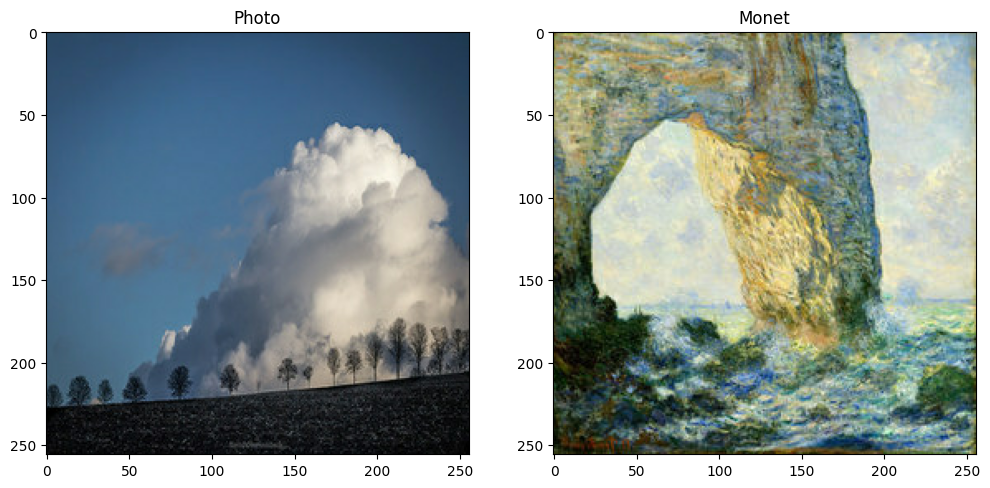

In [40]:
# visualize photo example
plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0] * 0.5 + 0.5)

Now that we have properly loaded in the data, we must build our generator. We will use a U-Net architecture for our CycleGAN. 

Some information about U-Net: https://www.geeksforgeeks.org/u-net-architecture-explained/

In [41]:
OUTPUT_CHANNELS = 3

# reduces the 2D dimensions of the image by 
# the length of the step the filter takes
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    # strides = 2 reduces the weight and height by 2 -- applies the filter
    # to every other pixel
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

# increases the dimensions of the image
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

Our generator will first downsample the image and then upsample it. We will use long skip connections to help avoid the vanishing gradient problem, through concatenating the output of the downsample layer to the upsample layer symmetrically.

In [42]:
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

Next we will build the discriminator. It will take in the input image and classify it as real or generated. It will output a smaller 2D image with higher pixel values for a real classification and lower for a fake classification.

In [43]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

In [44]:
# set generators and discriminators for each type of image
monet_generator = Generator() # photo -> Monet
photo_generator = Generator() # Monet -> photo

monet_discriminator = Discriminator() # real Monet paintings vs generated Monet paintings
photo_discriminator = Discriminator() # real photos vs generated photos

Now we must build our model!

In [45]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)
            
            
        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
                   
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [46]:
# compares real images to a matrix of 1s and fake to a matrix of 0s
# outputs the average of real and generated loss
def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

# compares generated image to a matrix of 1s to find loss
def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

# calculates cycle consistency loss by finding the average of the difference 
# between the original photo and the twice transformed photo
def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

# compares input with the output of the generator
def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss


Now we must train our model!!

In [49]:
monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

cycle_gan_model.compile(
    m_gen_optimizer = monet_generator_optimizer,
    p_gen_optimizer = photo_generator_optimizer,
    m_disc_optimizer = monet_discriminator_optimizer,
    p_disc_optimizer = photo_discriminator_optimizer,
    gen_loss_fn = generator_loss,
    disc_loss_fn = discriminator_loss,
    cycle_loss_fn = calc_cycle_loss,
    identity_loss_fn = identity_loss
)


# We will train on a subset of the dataset for efficiency
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds.take(3), photo_ds.take(3))),
    epochs=25
)

Epoch 1/25
3/3 [==============================] - 72s 9s/step - monet_gen_loss: 11.9476 - photo_gen_loss: 12.6983 - monet_disc_loss: 0.3604 - photo_disc_loss: 0.3663
Epoch 2/25
3/3 [==============================] - 13s 4s/step - monet_gen_loss: 11.9520 - photo_gen_loss: 12.7194 - monet_disc_loss: 0.3551 - photo_disc_loss: 0.3593
Epoch 3/25
3/3 [==============================] - 12s 4s/step - monet_gen_loss: 11.9521 - photo_gen_loss: 12.7065 - monet_disc_loss: 0.3427 - photo_disc_loss: 0.3527
Epoch 4/25
3/3 [==============================] - 12s 4s/step - monet_gen_loss: 11.9454 - photo_gen_loss: 12.6594 - monet_disc_loss: 0.3358 - photo_disc_loss: 0.3472
Epoch 5/25
3/3 [==============================] - 12s 4s/step - monet_gen_loss: 11.9351 - photo_gen_loss: 12.6306 - monet_disc_loss: 0.3260 - photo_disc_loss: 0.3399
Epoch 6/25
3/3 [==============================] - 14s 5s/step - monet_gen_loss: 11.8601 - photo_gen_loss: 12.5685 - monet_disc_loss: 0.3251 - photo_disc_loss: 0.3299
Epoc

Now we can visualize our Monet-esque photos!!

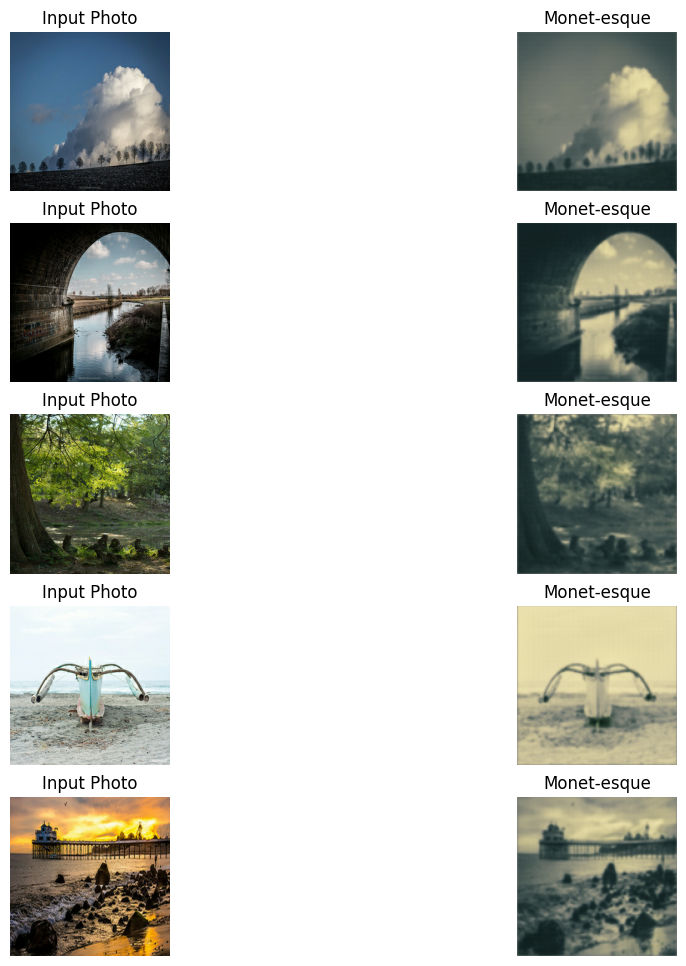

In [50]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

### Model 2: Pretrained VGG19

Next, we will use a model that only takes in one style image and one content image, in order to transform the content image to be in the style of the Monet painting.

This method optimizes the output image to match the content statistics of the content image and the style statistics of the style reference image. We will extract these statistics through the use of the VGG19 Convolutional Neural Network. 

Reference: https://www.tensorflow.org/tutorials/generative/style_transfer#:~:text=Neural%20style%20transfer%20is%20an,of%20the%20style%20reference%20image.

In [17]:
import os
import tensorflow as tf
import IPython.display as display

import numpy as np
import PIL.Image
import time
import functools

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False


os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [18]:
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

In the cell below, you can change the input images!

In [5]:
# CHANGE THIS TO BE THE DESIRED CONTENT AND STYLE IMAGES
style_path = 'data/monet_jpg/0a5075d42a.jpg'

content_path = 'data/photo_jpg/0a0c3a6d07.jpg'

In [19]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)


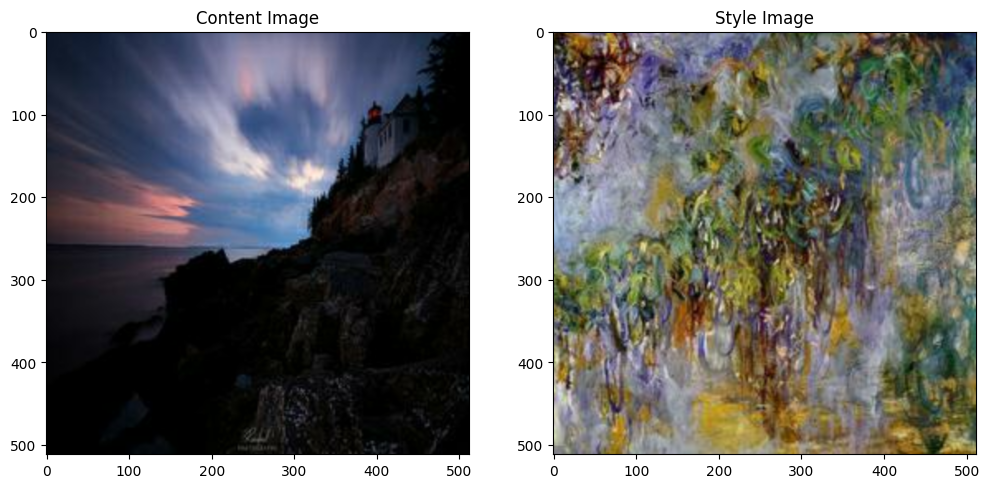

In [21]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [20]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [22]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('lakeside', 0.4804342),
 ('boathouse', 0.11157116),
 ('breakwater', 0.063018896),
 ('dam', 0.055324934),
 ('rapeseed', 0.02120156)]

In [23]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)


input_4
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [26]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

Now we can build the model!

In [24]:
def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [27]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 512, 512, 64)
  min:  0.0
  max:  738.9157
  mean:  22.250065

block2_conv1
  shape:  (1, 256, 256, 128)
  min:  0.0
  max:  2345.9631
  mean:  123.094154

block3_conv1
  shape:  (1, 128, 128, 256)
  min:  0.0
  max:  6780.4565
  mean:  123.60545

block4_conv1
  shape:  (1, 64, 64, 512)
  min:  0.0
  max:  13966.134
  mean:  459.03903

block5_conv1
  shape:  (1, 32, 32, 512)
  min:  0.0
  max:  1991.0521
  mean:  31.067347



In [28]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [29]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [30]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0
    max:  49169.934
    mean:  464.08853

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  48349.008
    mean:  8578.297

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  229334.81
    mean:  5819.8477

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  3578657.8
    mean:  108662.31

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  43165.953
    mean:  456.43695

Contents:
   block5_conv2
    shape:  (1, 32, 32, 512)
    min:  0.0
    max:  929.7041
    mean:  7.253266


In [31]:
# Gradient descent
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

style_weight=1e-2
content_weight=1e4

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

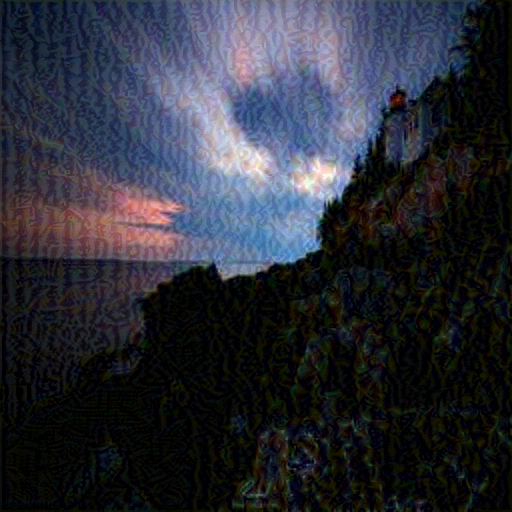

In [17]:
# to test
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

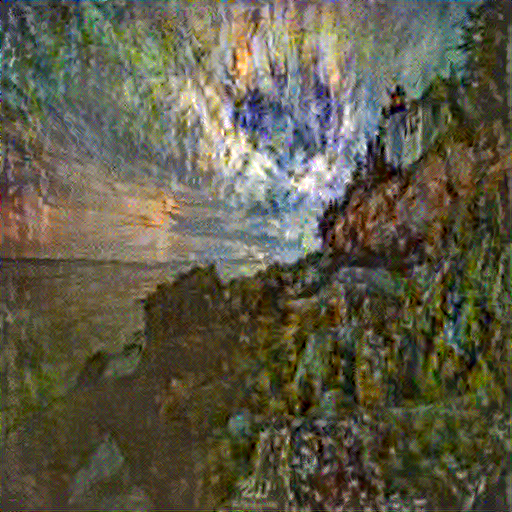

Train step: 1000
Total time: 20827.1


In [18]:
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

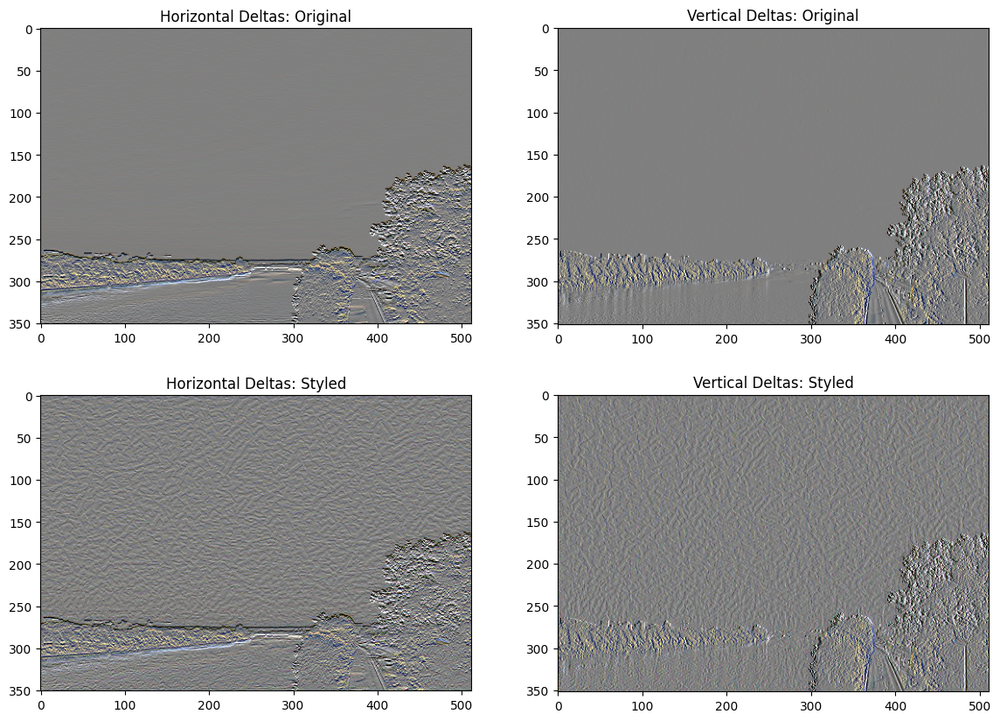

In [49]:
# Variation Loss
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

x_deltas, y_deltas = high_pass_x_y(content_image)

plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Original")

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2, 2, 3)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Styled")

plt.subplot(2, 2, 4)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Styled")

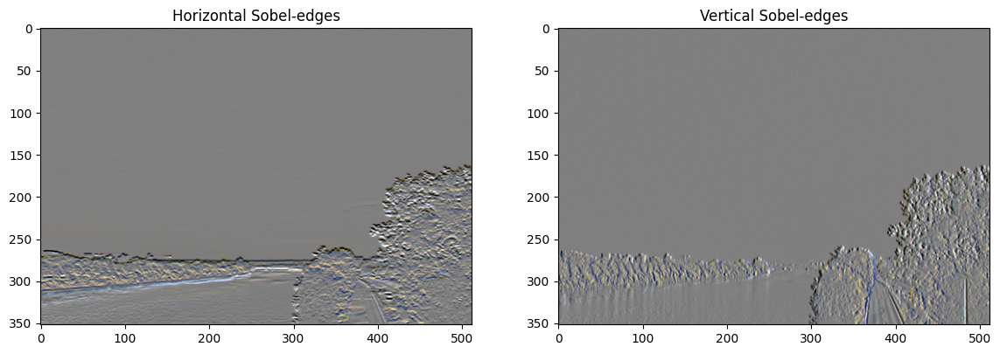

In [50]:
plt.figure(figsize=(14, 10))

sobel = tf.image.sobel_edges(content_image)
plt.subplot(1, 2, 1)
imshow(clip_0_1(sobel[..., 0]/4+0.5), "Horizontal Sobel-edges")
plt.subplot(1, 2, 2)
imshow(clip_0_1(sobel[..., 1]/4+0.5), "Vertical Sobel-edges")

In [51]:
tf.image.total_variation(image).numpy()

array([36981.97], dtype=float32)

In [51]:
total_variation_weight=30

def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [39]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

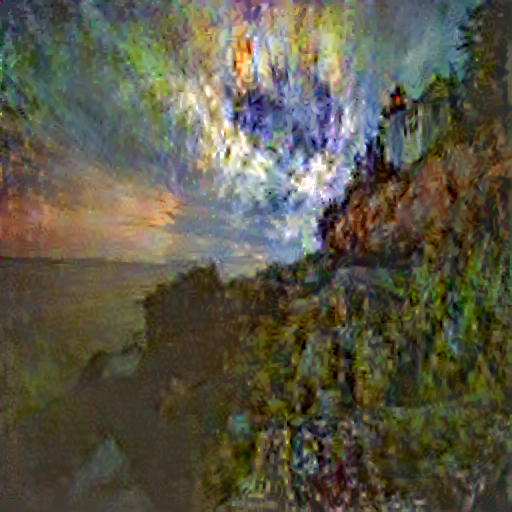

Train step: 1000
Total time: 7975.1


In [24]:
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Now we will use this to transform images of the real locations that Monet's paintings were based on, with the paintings of the respective locations. Here are the pairings of the images: https://artsandculture.google.com/story/monet-39-s-places-museum-barberini/4QVh4RrD0OqgmA?hl=en

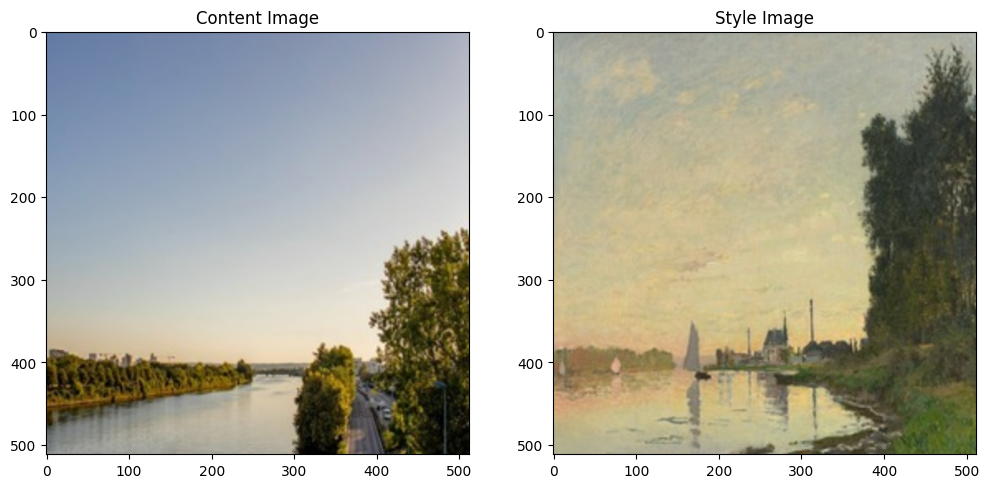

In [40]:
content_image = load_img('data/monet_ref_loc.jpg/Argenteuil.jpg')
style_image = load_img('data/monet_loc.jpg/Argenteuil.jpg')

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [41]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('lakeside', 0.4804342),
 ('boathouse', 0.11157116),
 ('breakwater', 0.063018896),
 ('dam', 0.055324934),
 ('rapeseed', 0.02120156)]

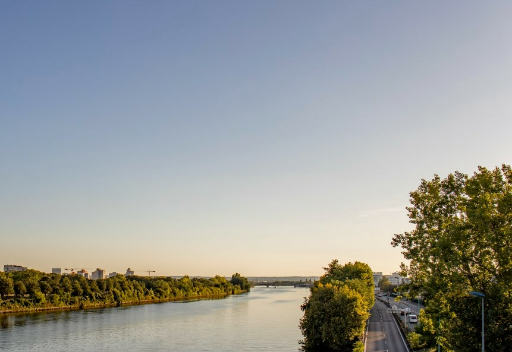

In [54]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

# Gradient descent
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

style_weight=1e-2
content_weight=1e4

tensor_to_image(image)

In [33]:
opt = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

start = time.time()

epochs = 10
steps_per_epoch = 20

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

.

KeyboardInterrupt: 

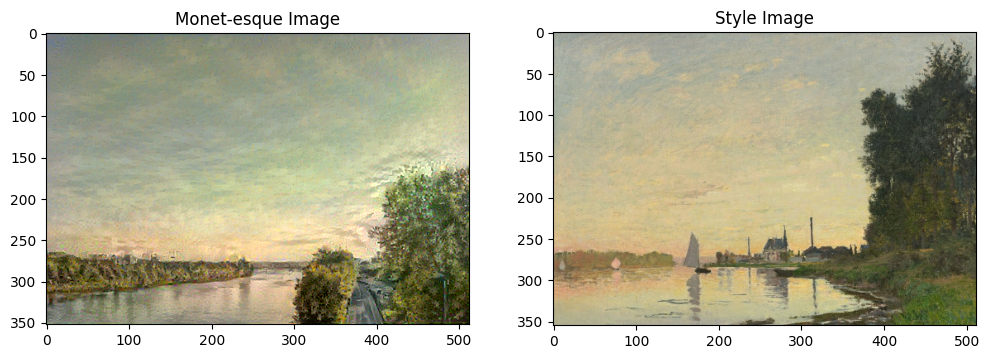

In [62]:
plt.subplot(1, 2, 1)
imshow(image, 'Monet-esque Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

I am going to synthesize all of this transformation code into one function that we can call on any set of content and style images.

In [55]:
'''
Pass in the jpg image path for content and style images
'''
def monetize(content_path, style_path):
    content_image = load_img(content_path)
    style_image = load_img(style_path)
    x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
    x = tf.image.resize(x, (224, 224))
    vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
    prediction_probabilities = vgg(x)
    prediction_probabilities.shape
    
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

    content_layers = ['block5_conv2'] 

    style_layers = ['block1_conv1',
                    'block2_conv1',
                    'block3_conv1', 
                    'block4_conv1', 
                    'block5_conv1']

    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    style_extractor = vgg_layers(style_layers)
    style_outputs = style_extractor(style_image*255)

    extractor = StyleContentModel(style_layers, content_layers)

    results = extractor(tf.constant(content_image))
    
    # Gradient descent
    style_targets = extractor(style_image)['style']
    content_targets = extractor(content_image)['content']

    image = tf.Variable(content_image)
    
    opt = tf.keras.optimizers.legacy.Adam(learning_rate=0.001, beta_1=0.99, epsilon=1e-1)

    style_weight=1e-2
    content_weight=1e4

    start = time.time()

    epochs = 10
    steps_per_epoch = 10

    step = 0
    for n in range(epochs):
        for m in range(steps_per_epoch):
            step += 1
            train_step(image)
            print(".", end='', flush=True)
        display.clear_output(wait=True)
        display.display(tensor_to_image(image))
        print("Train step: {}".format(step))

    end = time.time()
    print("Total time: {:.1f}".format(end-start))

    plt.subplot(1, 3, 1)
    imshow(content_image, 'Original Photo')

    plt.subplot(1, 3, 2)
    imshow(image, 'Monet-ized Image')

    plt.subplot(1, 3, 3)
    imshow(style_image, 'Monet Painting')

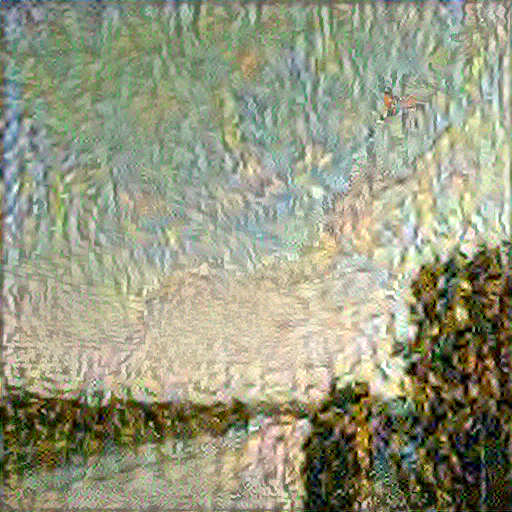

Train step: 100
Total time: 709.9


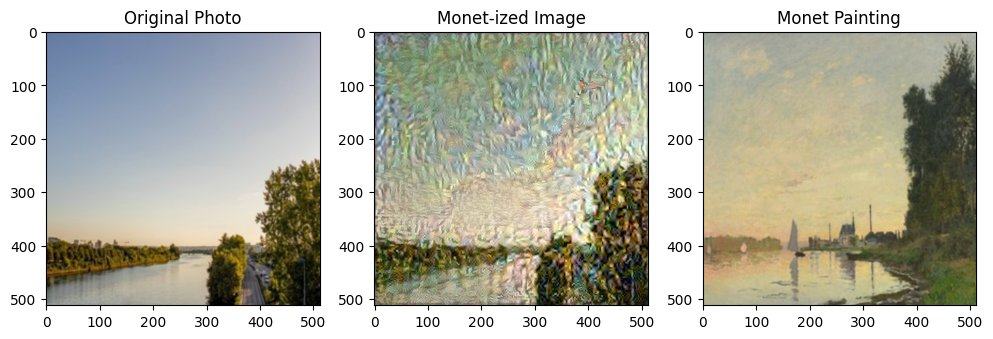

In [43]:
# Argenteuil
argentuil_content_path = 'data/monet_ref_loc.jpg/Argenteuil.jpg'
argentuil_style_path = 'data/monet_loc.jpg/Argenteuil.jpg'

monetize(argentuil_content_path, argentuil_style_path)

In [56]:
# La Havre
havre_content_path = 'data/monet_ref_loc.jpg/LaHavre.jpg'
havre_style_path = 'data/monet_loc.jpg/LaHavre.jpg'

monetize(havre_content_path, havre_style_path)

KeyError: 'The optimizer cannot recognize variable Variable:0. This usually means you are trying to call the optimizer to update different parts of the model separately. Please call `optimizer.build(variables)` with the full list of trainable variables before the training loop or use legacy optimizer `tf.keras.optimizers.legacy.Adam.'

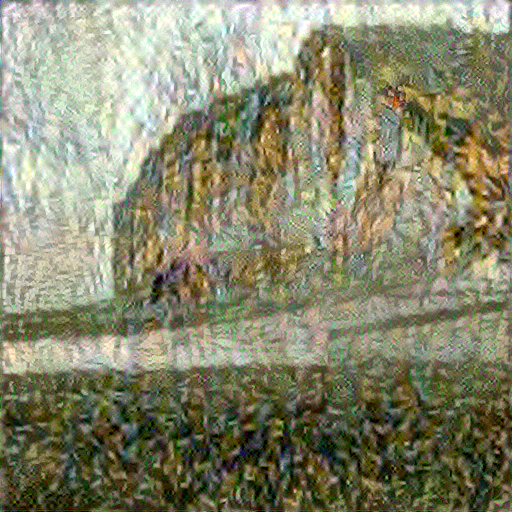

Train step: 100
Total time: 705.1


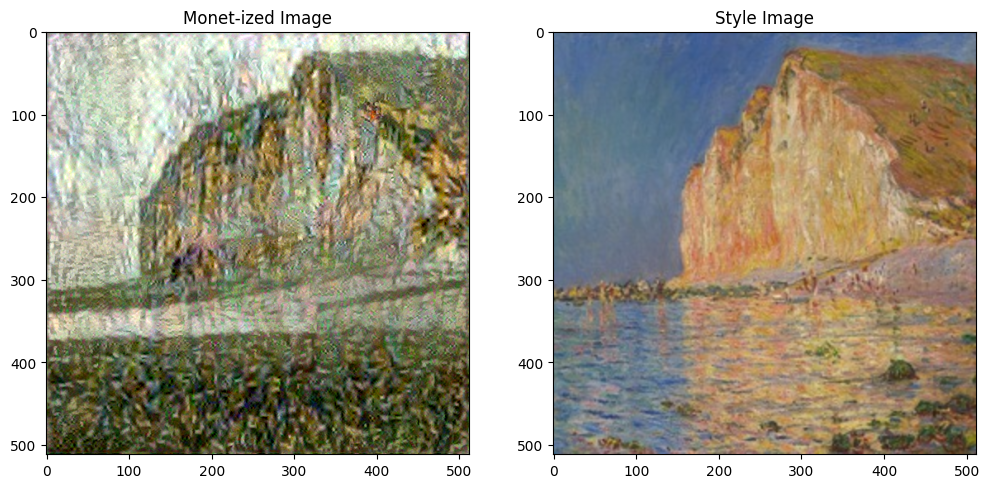

In [24]:
# Petite-Dalles
dalles_content_path = 'data/monet_ref_loc.jpg/Petites-Dalles.jpg'
dalles_style_path = 'data/monet_loc.jpg/Petites-Dalles.jpg'

monetize(dalles_content_path, dalles_style_path)

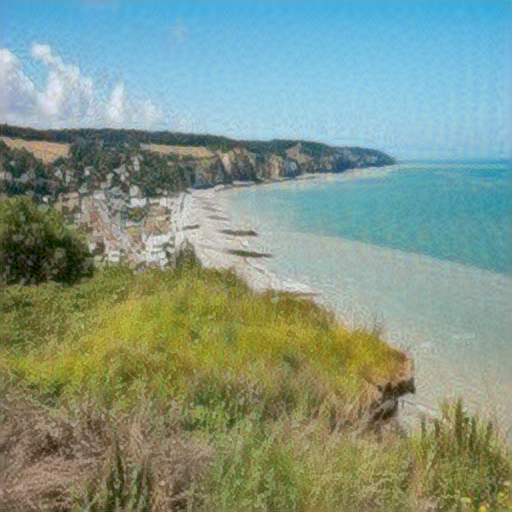

Train step: 100
Total time: 558.7


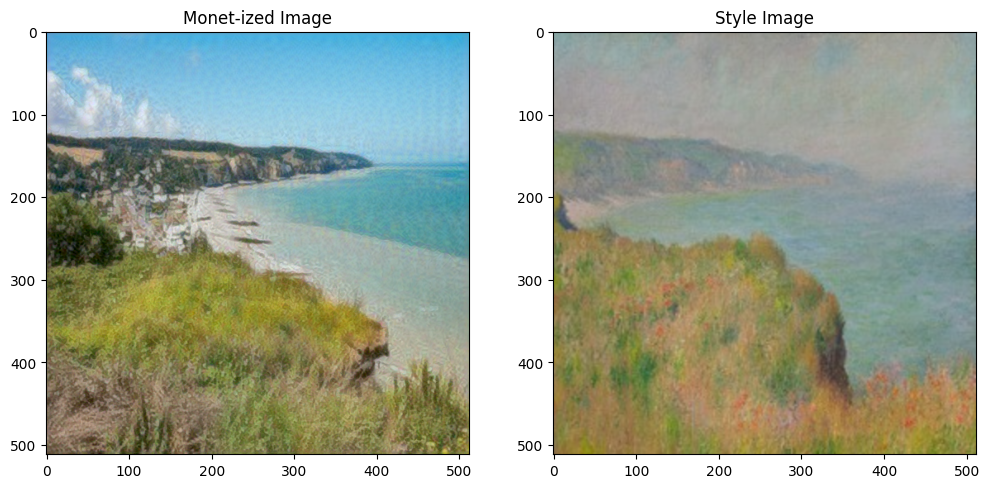

In [35]:
# Pourville
pourville_content_path = 'data/monet_ref_loc.jpg/Pourville.jpg'
pourville_style_path = 'data/monet_loc.jpg/Pourville.jpg'

monetize(pourville_content_path, pourville_style_path)

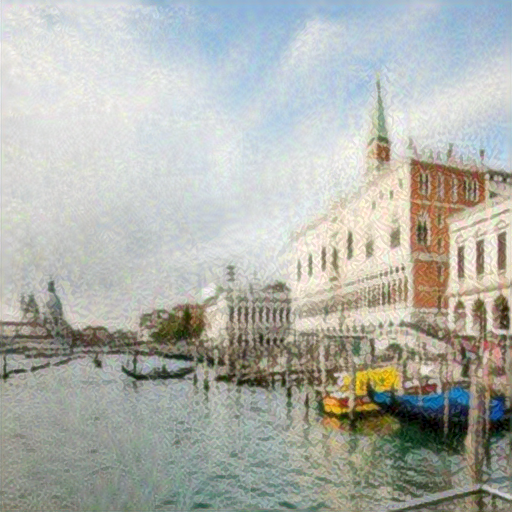

Train step: 100
Total time: 488.2


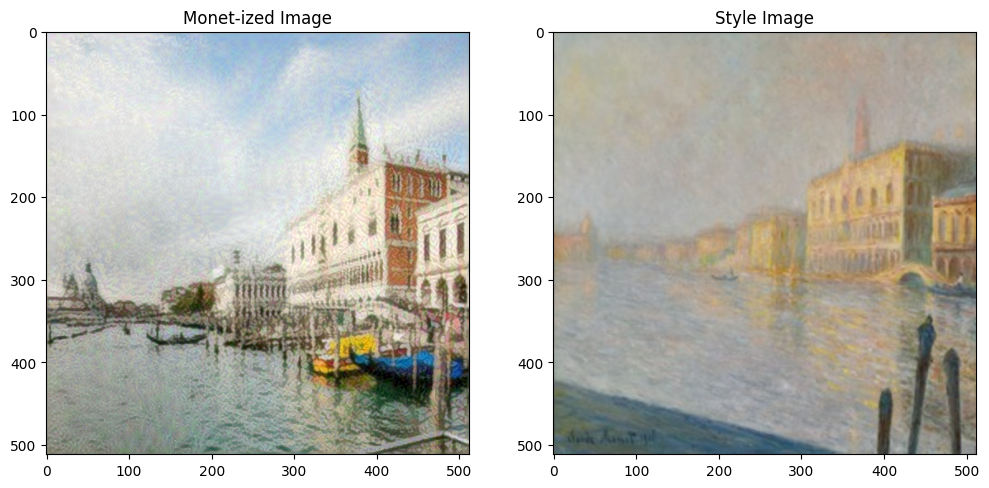

In [32]:
# Venice
venice_content_path = 'data/monet_ref_loc.jpg/Venice.jpg'
venice_style_path = 'data/monet_loc.jpg/Venice.jpg'

monetize(venice_content_path, venice_style_path)